# Stat2: finding patterns in data

## Learning objectives
* Embrace the subjective nature of Exploratory Data Analysis 
* Data cleaning / feature selection
* Feature transformation
* Relationships and alternative representation (dimentionality reduction)
* Clustering and cluster evaluation. 

# Goals and Pitfalls of Exploratory Data Analysis (EDA)

## Goals

1. **Data Understanding**:  
    Let the data "speak for itself" - can we learn something new from large scale data
      

2. **Data is flawed**:  
    Data often contains missing values, outliers, and noise. 


3. **Data needs purification**:
    In high throughput measurements, we often measure lots of stuff, most of it is "junk". Junk is not labeled as such. 


4. **Relationships and summeries**:  
    Identify correlations or associations between variables. Often many parts of the data are saying the same thing. 


5. **Visualization**:  
    Use graphical representations to understand and present data clearly. 

## Pitfalls

1. **Yeah? Well, you know, that's just like your opinion, man**:  
    The large number of ways to manipulate data is staggering, in the end, EDA is subjective.


2. **Confirmation Bias**:  
    Subjective nature of EDA often cause us to find what we are looking for, which is against the whole goal. 


4. **Data fishing**:  
    Any process that you continue until you find something is problematic. What is there is nothing there to find? 


5. **Ignoring the Big Picture**:  
    Hard to balance specifics with overall goal, easy to get lost in the weeds.


6. **Time-Consuming**:  
    EDA can be labor-intensive and time-consuming, especially for large datasets.



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import random
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from scipy.spatial import distance_matrix
from scipy.spatial import distance

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
ca_genes = pd.read_csv('../Data/vol_adjusted_genes.csv')
ca_genes

,ACTA2,ADCY1,ADCY3,ADCY4,ADCY7,ADCY9,ADORA2B,ADRA1A,ADRA1B,ADRA1D,...,TECPR2,TOP2A,TP63,TRDN,TRPC1,TRPC4,TRPC4AP,TRPC6,TRPC7,VDAC3
0,2.148889,0.001791,9.740348,0.002540,6.428792,2.168981,0.031902,0.000417,0.009810,0.001857,...,5.234478,2.325979,1.122229,0.000657,2.038048,0.008440,10.912966,0.001673,0.006307,3.309445
1,0.280360,0.009174,6.198372,0.013026,4.417532,0.322593,0.173783,0.002130,3.204282,0.009511,...,1.432075,4.078019,0.353462,0.003358,2.199249,1.087630,6.510134,0.008567,0.032599,9.237992
2,0.595675,0.000000,6.167533,0.000000,4.305248,5.196184,0.000000,0.000000,1.866506,0.982774,...,3.181585,2.090920,12.650549,0.000000,0.000000,0.923139,10.032210,0.000000,0.000000,5.358432
3,0.000000,0.000000,7.869113,0.000000,0.809859,0.824071,0.000000,0.000000,0.000000,0.000000,...,0.875232,28.430255,14.387247,0.000000,0.958092,0.000000,7.746137,0.000000,0.000000,6.940832
4,3.131047,0.001192,12.632861,1.003379,3.161444,2.111429,2.063361,0.000278,2.019554,0.001235,...,0.025842,21.492302,6.281881,0.000437,1.016846,2.016828,9.544973,0.001113,0.004193,13.711790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5123,0.210191,0.007075,16.223209,0.010041,2.791560,3.963567,0.131664,0.001644,0.039199,0.007334,...,0.162985,0.501222,1.526380,0.002591,0.050891,2.100970,5.844706,0.006607,0.025072,4.364391
5124,2.276067,0.000000,5.704864,0.000000,2.130644,3.786941,0.757171,0.000000,0.921122,0.000000,...,0.707679,9.458492,6.047821,0.000000,0.000000,1.897853,6.918903,0.000000,0.000000,1.942197
5125,3.127999,0.000000,11.061303,0.000000,0.000000,2.220329,0.000000,0.000000,0.000000,0.000000,...,0.718533,12.962806,24.305818,0.000000,0.902717,0.000000,6.294501,0.000000,0.000000,1.978657
5126,4.762056,0.013579,17.842195,0.019298,2.130384,0.511238,0.266990,0.003148,1.152672,0.014078,...,1.669853,14.229134,0.563620,0.004963,0.099626,0.065381,6.294464,0.012679,0.048518,2.506624


The dataset contains the expression of 336 genes per cell for 5128 cells. Measured using MERFISH (Foreman et al, 2020)

How can we look at all this data? Start by summaries - population means. 

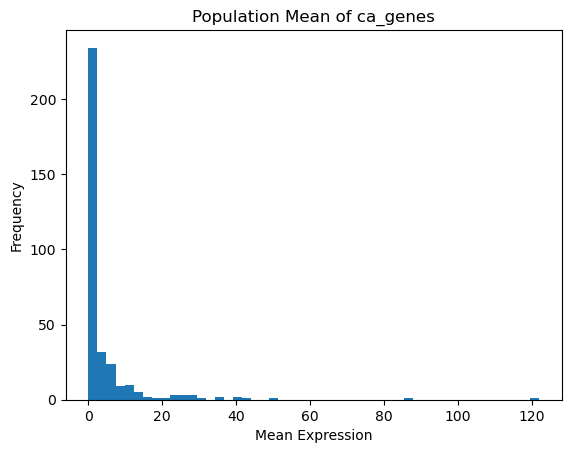

In [3]:
plt.hist(ca_genes.mean(axis=0),bins=50)
plt.title('Population Mean of ca_genes')
plt.xlabel('Mean Expression')
plt.ylabel('Frequency')
plt.show()


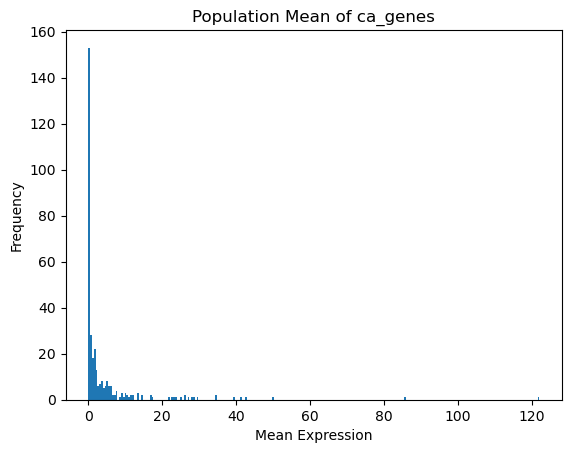

In [4]:
plt.hist(ca_genes.mean(axis=0),bins=250)
plt.title('Population Mean of ca_genes')
plt.xlabel('Mean Expression')
plt.ylabel('Frequency')
plt.show()


There is suspecisouly high bar around 0 - how much of it is actually zeroes? 

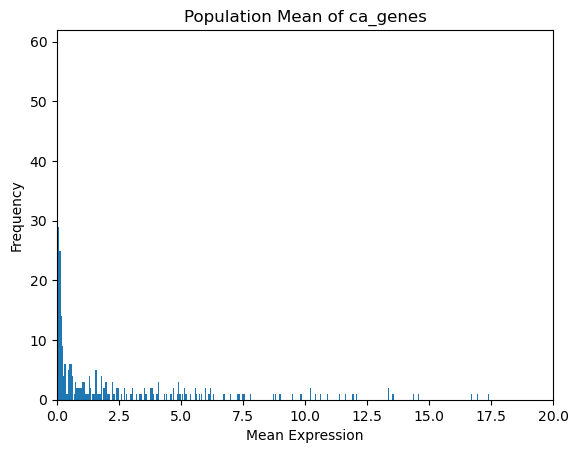

In [8]:
plt.hist(ca_genes.mean(axis=0),bins=2500)
plt.title('Population Mean of ca_genes')
plt.xlabel('Mean Expression')
plt.ylabel('Frequency')
plt.xlim([0,20])
plt.show()

In [5]:
print(f"There are {np.sum(ca_genes.mean(axis=0)==0)} genes with population average expression of 0")

There are 8 genes with population average expression of 0


<span style='color:orange'>remove columns who mean is zero from ca_genes</span>

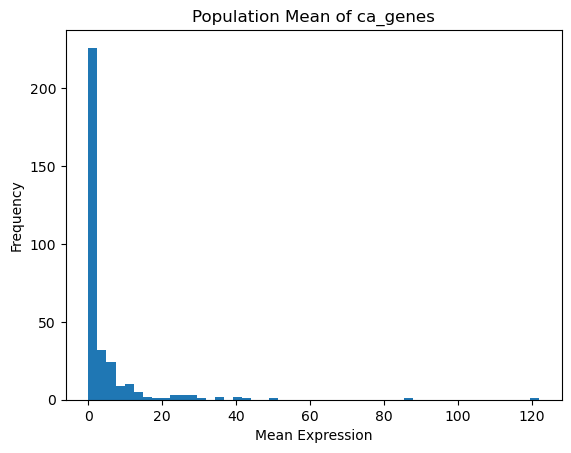

In [12]:
ca_genes = ca_genes.loc[:, (ca_genes != 0).any(axis=0)]
plt.hist(ca_genes.mean(axis=0),bins=50)
plt.title('Population Mean of ca_genes')
plt.xlabel('Mean Expression')
plt.ylabel('Frequency')
plt.show()

There are a few genes with high expression that makes this plot horrible - does it help remove them for the viz? 

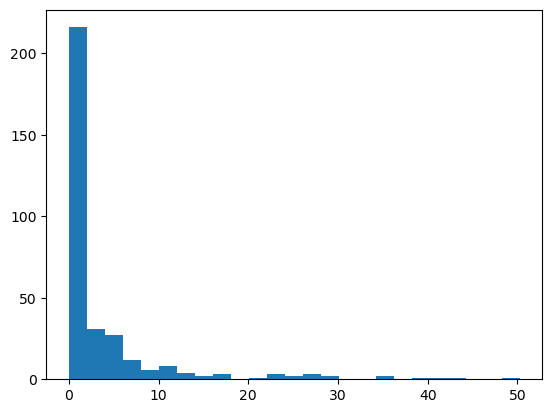

In [13]:
gene_avg = ca_genes.mean(axis=0)

plt.hist(gene_avg[gene_avg<80],bins=25);

What about 20? 

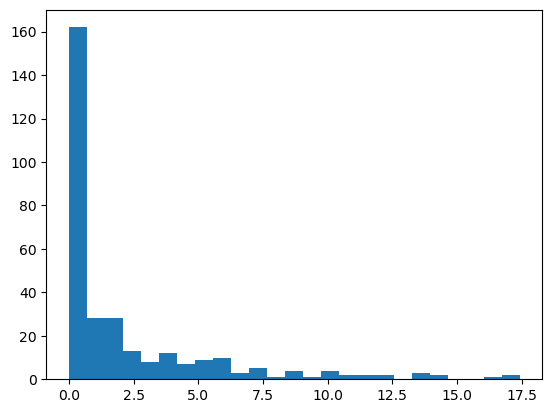

In [14]:
plt.hist(gene_avg[gene_avg<20],bins=25);

What about 5? 

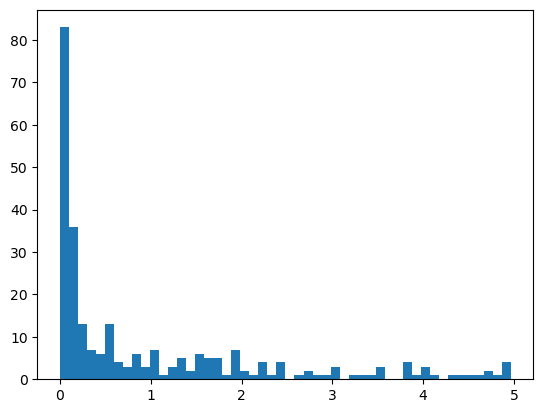

In [15]:
plt.hist(gene_avg[gene_avg<5],bins=50);

Clearly - just removing points is not the answer, there is a PATTERN in here

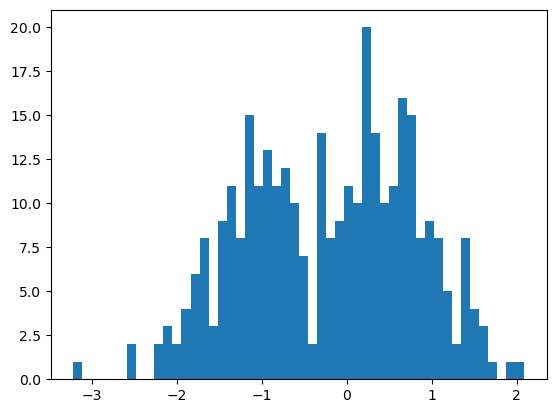

In [16]:
plt.hist(np.log10(gene_avg),bins=50);


There are two populations - genes with high values (expressed?) and genes with very low value (not expressed?)

Text(0.5, 0, 'Fraction of cells with zero expression')

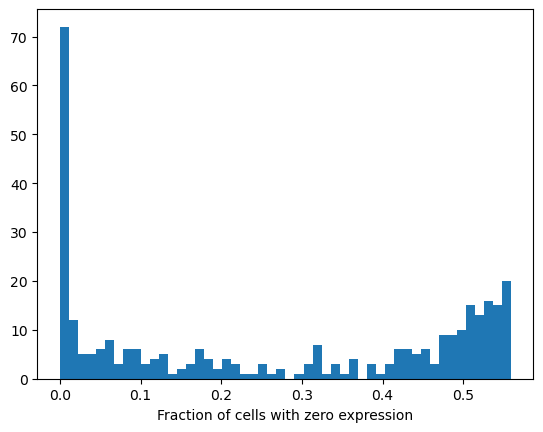

In [18]:
frac_not_express = np.mean(ca_genes==0,axis=0)
plt.hist(frac_not_express,bins=50);
plt.xlabel("Fraction of cells with zero expression")

Text(0, 0.5, 'Fraction with zero expression')

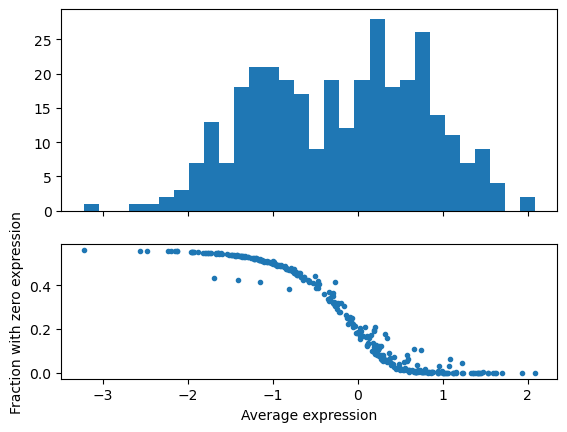

In [19]:
fig, axs = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3, 2]})
axs[0].hist(np.log10(gene_avg),bins=30)
axs[1].plot(np.log10(np.mean(ca_genes,axis=0)),frac_not_express,'.')
axs[1].set_xlabel('Average expression')
axs[1].set_ylabel('Fraction with zero expression')

Option 1 : use the population mean and remove all genes that have log10 expression < 0.4

Text(-3, 0.1, '139 genes under cutoff')

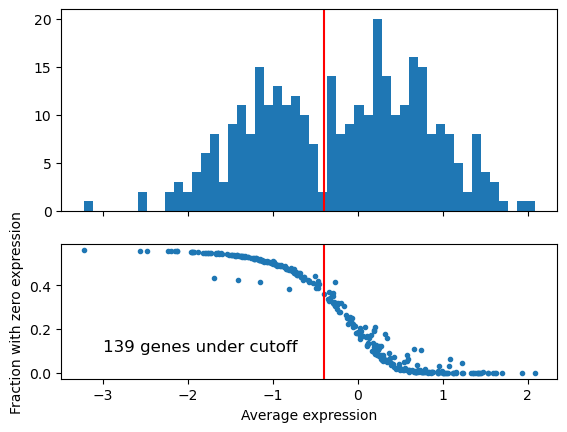

In [20]:
fig, axs = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3, 2]})
axs[0].hist(np.log10(gene_avg),bins=50)
axs[1].plot(np.log10(np.mean(ca_genes,axis=0)),frac_not_express,'.')
axs[1].set_xlabel('Average expression')
axs[1].set_ylabel('Fraction with zero expression')

cutoff_mean_expression = -0.4

axs[0].axvline(cutoff_mean_expression, color='r')
axs[1].axvline(cutoff_mean_expression, color='r')
num_genes = np.sum(np.log10(gene_avg) <cutoff_mean_expression)
axs[1].text(-3, 0.1, f"{num_genes} genes under cutoff", fontsize=12)


But, maybe using only averages hides some stuff? even in the most lowly expressed cases, there are still >40-50% of the cells with some expression? 

We should explore other summaries. For example the quantile (using 90% quantile)

Text(-3, 0.1, '94 genes under cutoff')

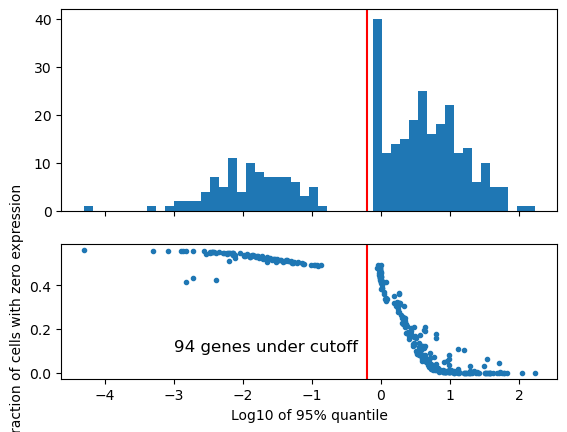

In [24]:
qntl = 0.9
fig, axs = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3, 2]})
axs[0].hist(np.log10(np.quantile(ca_genes,qntl,axis=0)),bins=50)
axs[1].plot(np.log10(np.quantile(ca_genes,qntl,axis=0)),frac_not_express,'.')
axs[1].set_ylabel('Fraction of cells with zero expression')
axs[1].set_xlabel('Log10 of 95% quantile')

cutoff_q90_expression = -0.2

axs[0].axvline(cutoff_q90_expression, color='r')
axs[1].axvline(cutoff_q90_expression, color='r')
num_genes = np.sum(np.log10(np.quantile(ca_genes,qntl,axis=0)) < cutoff_q90_expression)
axs[1].text(-3, 0.1, f"{num_genes} genes under cutoff", fontsize=12)


Which of these is the correct one? What happens if you switch to 95%? or to 85%? 

I don't really know. It all depends... There is no limit to exploration. Do your best

In [1]:

expressed_genes = ca_genes.iloc[:,np.log10(np.quantile(ca_genes,qntl,axis=0)) > cutoff_q90_expression]
expressed_genes.shape
print(type(expressed_genes))

NameError: name 'ca_genes' is not defined

Moving on - a key challenge is that the columns in our data still have very different scales. 

any operations we'll do that combines them together (distances, etc) will be problematic. 

You can think of this is a matter of "units" does mRNA counts of a key TF is the same as mRNA count of ca channel? 



Text(0, 0.5, 'Freq')

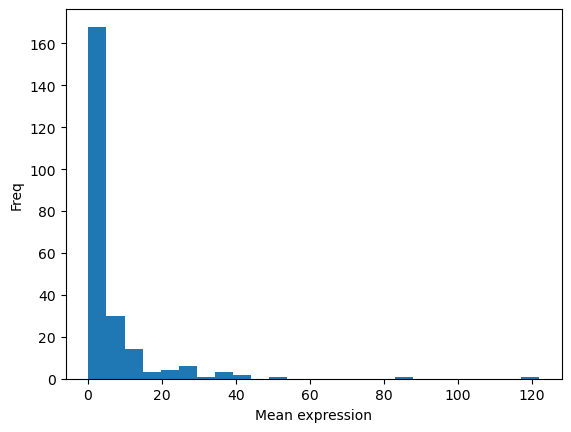

In [26]:
plt.hist(expressed_genes.mean(axis=0),bins=25)
plt.xlabel('Mean expression')
plt.ylabel('Freq')

There are many popular transformations: 

1. log(x+1) - can't use log(x) as there are lots of 0s in the data
2. z-score (x-mean(x))/std(x)

In [27]:
expressed_genes_zscore = expressed_genes.apply(stats.zscore)
expressed_genes_logxp1 = np.log10(expressed_genes + 1)

/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


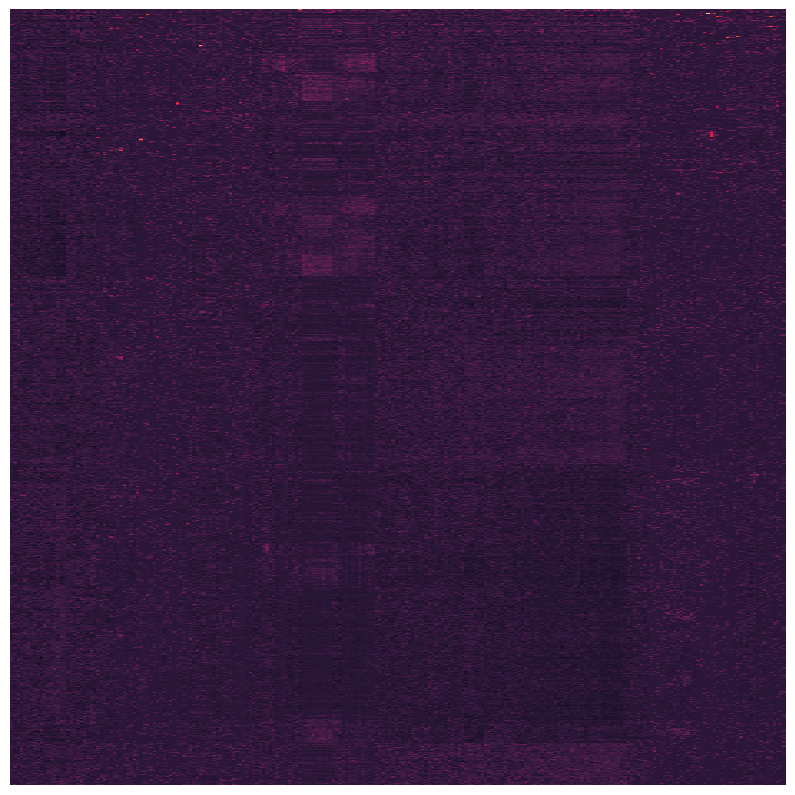

/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


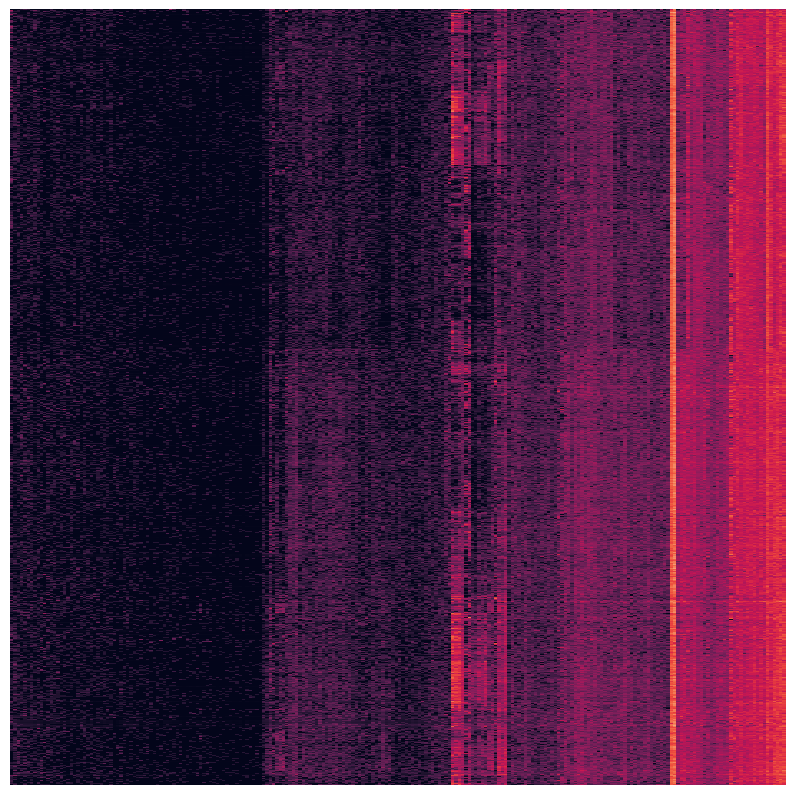

In [18]:
# Create a clustermap
clustermap_zscr = sns.clustermap(expressed_genes_zscore,xticklabels=False,yticklabels=False)

# Hide the dendrograms and colorbars - they are confusing at this point
clustermap_zscr.ax_row_dendrogram.set_visible(False)
clustermap_zscr.ax_col_dendrogram.set_visible(False)
clustermap_zscr.cax.remove()
# Show the modified clustermap
plt.show()

# Create a clustermap
clustermap_logxp1 = sns.clustermap(expressed_genes_logxp1,xticklabels=False,yticklabels=False)

# Hide the dendrograms and colorbars - they are confusing at this point
clustermap_logxp1.ax_row_dendrogram.set_visible(False)
clustermap_logxp1.ax_col_dendrogram.set_visible(False)
clustermap_logxp1.cax.remove()
# Show the modified clustermap
plt.show()

Which transformation is the right one? 

I don't know - these are two different interpretation of the data. You need to explore many of these (ask your robot for more (robust z-score, etc))

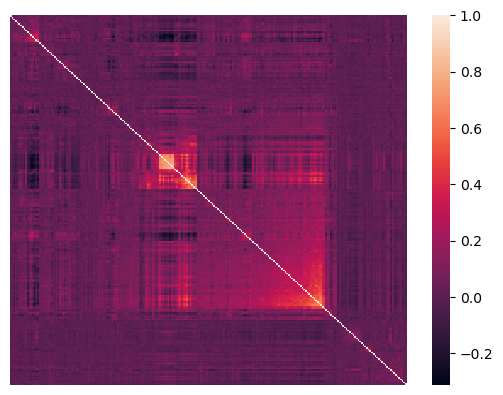

<Axes: >

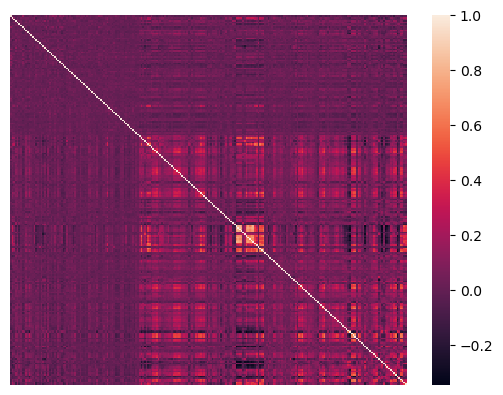

In [19]:
# Show the correlation coefficient matrix as a heatmap
# use the same columm ordering provided by clustermap (just for viz)
corr_zscr = expressed_genes_zscore.corr()
ordr = clustermap_zscr.dendrogram_col.reordered_ind
reordered_corr_zscr = corr_zscr.iloc[ordr,ordr]
sns.heatmap(reordered_corr_zscr,xticklabels=False,yticklabels=False)
plt.show()
corr_logxp1 = expressed_genes_logxp1.corr()
ordr = clustermap_logxp1.dendrogram_col.reordered_ind
reordered_corr_logxp1 = corr_logxp1.iloc[ordr,ordr]
sns.heatmap(reordered_corr_logxp1,xticklabels=False,yticklabels=False)


There are 26 pairs of genes with correlation > 0.7


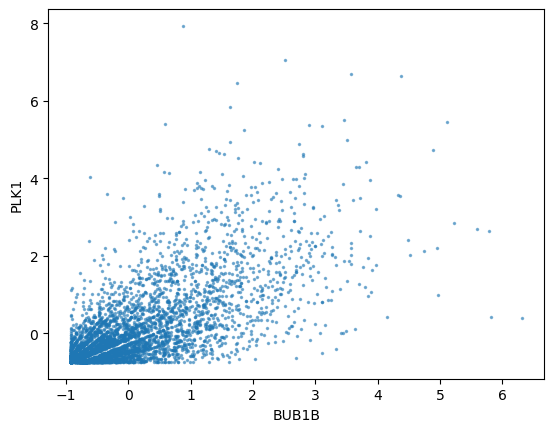

In [20]:
# create a boolean mask for correlation coefficients > 0.7
corr_cutoff = 0.7
mask = corr_zscr > corr_cutoff

# create a list of pairs of columns with correlation > 0.7
high_corr_pairs = [(corr_zscr.columns[i], corr_zscr.columns[j]) for i, j in zip(*np.where(mask)) if i < j]

# print the list of pairs
print(f"There are {len(high_corr_pairs)} pairs of genes with correlation > {corr_cutoff}")

# select a random pair from high_corr_pairs
pair = random.choice(high_corr_pairs)

# create a scatter plot of the pair
plt.plot(expressed_genes_zscore[pair[0]], expressed_genes_zscore[pair[1]],'.', markersize=3, alpha=0.5)

plt.xlabel(pair[0])
plt.ylabel(pair[1])
plt.show()



There are 22 pairs of genes with correlation > 0.7


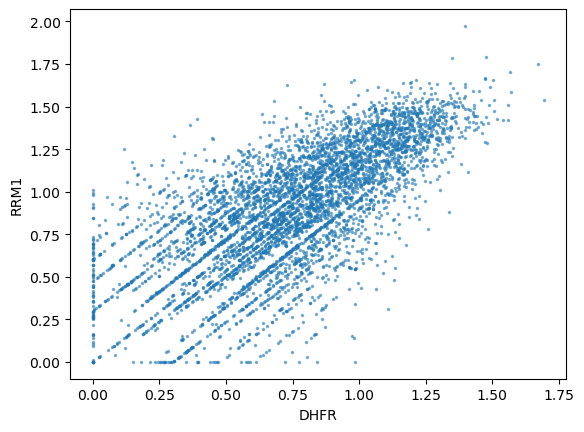

In [21]:
corr_cutoff = 0.7
mask = corr_logxp1 > corr_cutoff

# create a list of pairs of columns with correlation > 0.7
high_corr_pairs = [(corr_logxp1.columns[i], corr_logxp1.columns[j]) for i, j in zip(*np.where(mask)) if i < j]

# print the list of pairs
print(f"There are {len(high_corr_pairs)} pairs of genes with correlation > {corr_cutoff}")

# select a random pair from high_corr_pairs
pair = random.choice(high_corr_pairs)

# create a scatter plot of the pair
plt.plot(expressed_genes_logxp1[pair[0]], expressed_genes_logxp1[pair[1]],'.', markersize=3, alpha=0.5)
plt.xlabel(pair[0])
plt.ylabel(pair[1])
plt.show()


## Alternative representation - dimensionality reduction

Each cell in the data is represented by a vector of (transformed) gene expression. The size of that vector is pretty large. 

Can we find an alternative representation that is better? 

Text(0, 0.5, 'TOP20A')

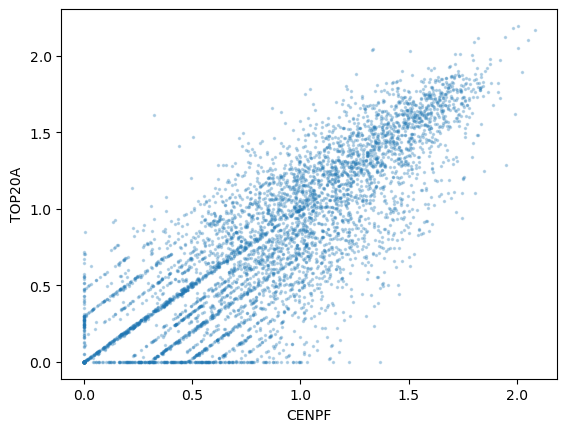

In [22]:
x = np.array(expressed_genes_logxp1['CENPF'])
y = np.array(expressed_genes_logxp1['TOP2A'])
plt.plot(x,y,'.',markersize=3,alpha=0.25)
plt.xlabel('CENPF')
plt.ylabel('TOP20A')

For illustration purposes, let's add two lines on these data. The first line (red) fits the direction with the most variance 
the second line (green) is simply orthogonal to the red line

We can think of the two new lines (red,green) as new axes, i.e. new coordinate system. And express each points based on it's red/green values. 


Text(0, 0.5, 'TOP20A')

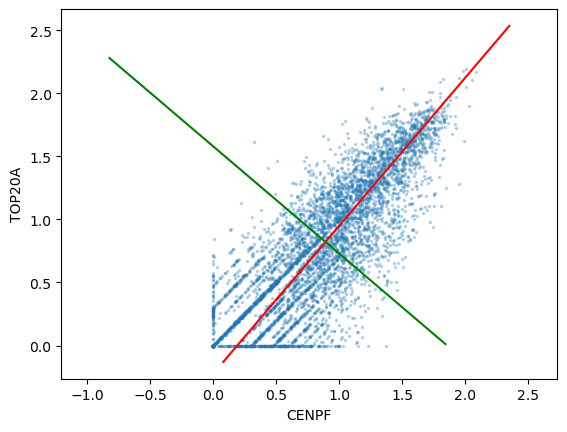

In [23]:
# plot a scatter plot of xy and add lines that match the principle components of xy 
plt.plot(x, y,'.',markersize=3,alpha=0.25)
pca = PCA(n_components=2)
xy = np.hstack((x[:,np.newaxis],y[:,np.newaxis]))
pca.fit(xy)
pc1, pc2 = pca.components_
# center the red/green line around the center of x and y
x_center = np.mean(x)
y_center = np.mean(y)

# extend the red/green lines that represent the PCs 
ext_fctr = 1.25
plt.plot([x_center - ext_fctr*pc1[0], pc1[0]+x_center + ext_fctr*pc1[0]], [y_center - ext_fctr*pc1[1], pc1[1]+y_center + ext_fctr*pc1[1]], color='red')
plt.plot([x_center - ext_fctr*pc2[0], pc2[0]+x_center + ext_fctr*pc2[0]], [y_center - ext_fctr*pc2[1], pc2[1]+y_center + ext_fctr*pc2[1]], color='green')
plt.axis('equal');
plt.xlabel('CENPF')
plt.ylabel('TOP20A')

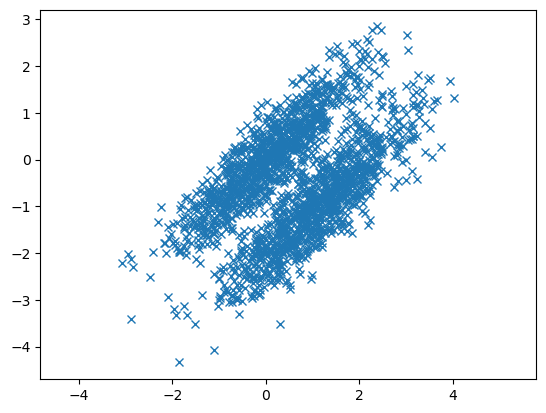

In [40]:
from numpy import random

# Create a random 2D array with high correlation
mean = [0, 0]
cov = [[1, 0.9], [0.9, 1]]  # diagonal covariance, points lie on x or y-axis
x, y = np.random.multivariate_normal(mean, cov, 1000).T
pca = PCA(n_components=2)
xy = np.vstack((x, y)).T
pca.fit(xy)
pc1, pc2 = pca.components_

# create new x1,y1 that are shifted from x and y in the direction orthogonal to the main variance
x1 = x + pc2[0]*1.5 + np.random.normal(0, 0.1, len(x))
y1 = y + pc2[1]*1.5 + np.random.normal(0, 0.1, len(y))

x = np.concatenate((x, x1))
y = np.concatenate((y, y1))


plt.plot(x, y, 'x')
plt.axis('equal')
plt.show()


In [ ]:
pca = PCA(n_components=2)
xy = np.vstack((x, y)).T
pca.fit(xy)
pc1, pc2 = pca.components_




/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


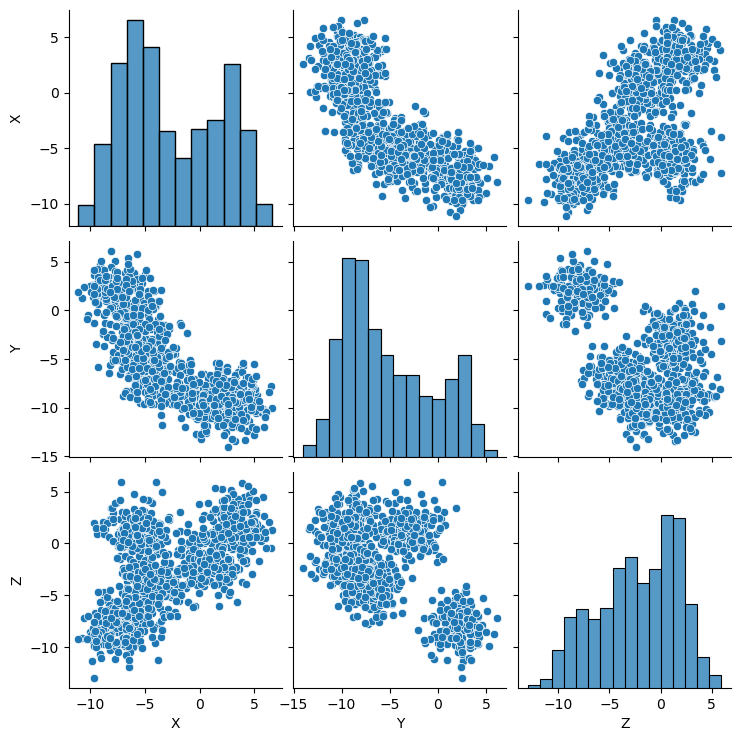

In [34]:
from sklearn.datasets import make_blobs
from seaborn import pairplot
import pandas as pd

# Create 3D data from mixed Gaussian with 5 components
# Increase the standard deviation of the blobs to increase the correlated variance within each blob
data, _ = make_blobs(n_samples=1000, centers=5, n_features=3, cluster_std=1.5)
df = pd.DataFrame(data, columns=['X', 'Y', 'Z'])

# Plot the pairs plot
pairplot(df)



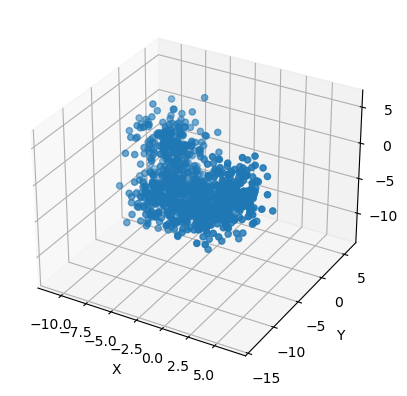

In [35]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['X'], df['Y'], df['Z'])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()


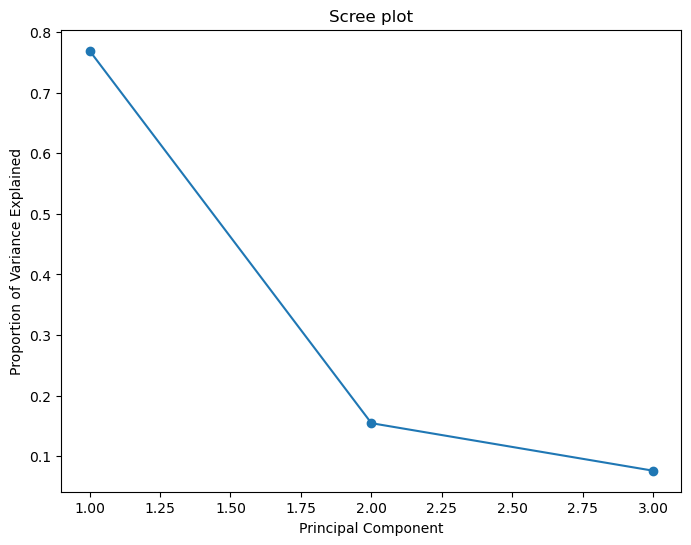

In [36]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Perform PCA
pca = PCA(n_components=3)
pca.fit(data)

# Plot the explained variance for each component
plt.figure(figsize=(8,6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, 'o-')
plt.title('Scree plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()


/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


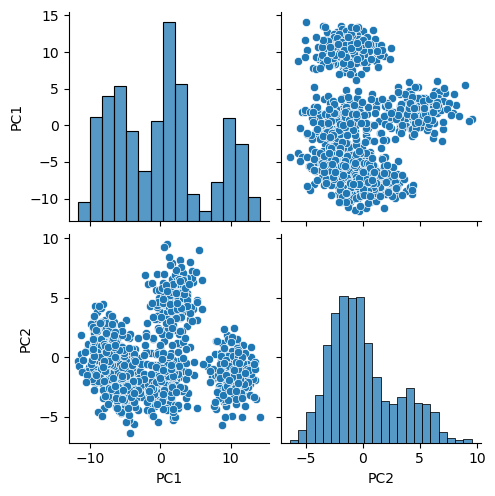

In [37]:
df_pca = pd.DataFrame(pca.transform(data), columns=['PC1', 'PC2', 'PC3'])
pairplot(df_pca[['PC1', 'PC2']])


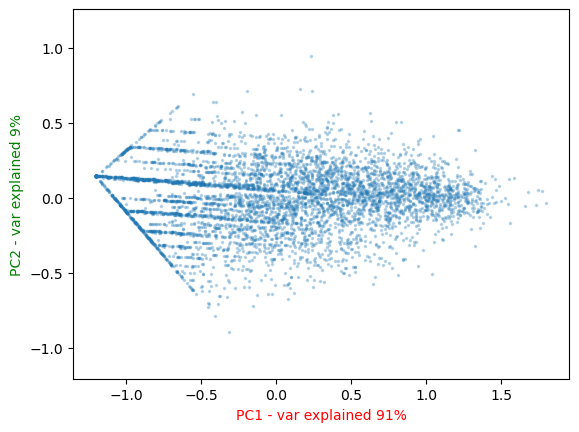

In [24]:
# plot the data in new PC space
plt.figure()
plt.plot(pca.transform(xy)[:,0], pca.transform(xy)[:,1], '.', markersize=3, alpha=0.25)
plt.xlabel(f'PC1 - var explained {pca.explained_variance_ratio_[0]*100:.0f}%', color='red')
plt.ylabel(f'PC2 - var explained {pca.explained_variance_ratio_[1]*100:.0f}%', color='green')
plt.axis('equal');


Key idea: we don't need both PC1 and PC2 - just looking captures what is going on in both of the genes. 

Summary: 

1. We found an alternative coordinate system to represent the data

2. The "rules" of the new coordinate system: 

    2.1 Origin at the cloud center

    2.2 Orthogonal directions following max variance of the cloud 

3. Once we see the % variance explained by each new axis, we can decide how many of them we are keeping

Ok, now lets do that for all genes

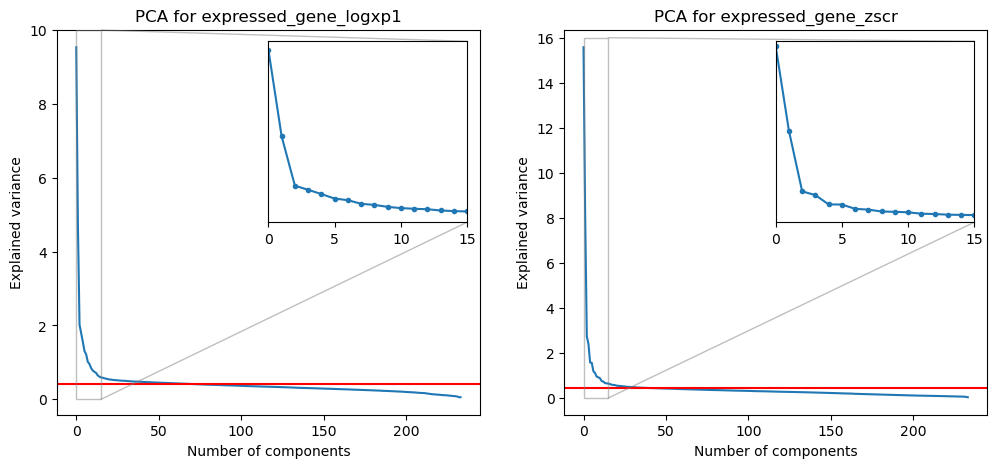

In [25]:
# perform PCA analysis for expressed_gene_logxp1 and expressed_gene_zscr and plot the explained variance as function of PC for both (two panel, one figure) properly labeled
pca_logxp1 = PCA().fit(expressed_genes_zscore)
pca_zscr = PCA().fit(expressed_genes_logxp1)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(pca_logxp1.explained_variance_ratio_*100)
axs[0].set_xlabel('Number of components')
axs[0].set_ylabel('Explained variance')
axs[0].set_title('PCA for expressed_gene_logxp1')
axs[0].axhline(y=100/expressed_genes_logxp1.shape[1], color='r', linestyle='-')


axs[1].plot(pca_zscr.explained_variance_ratio_*100)
axs[1].set_xlabel('Number of components')
axs[1].set_ylabel('Explained variance')
axs[1].set_title('PCA for expressed_gene_zscr')
axs[1].axhline(y=100/expressed_genes_zscore.shape[1], color='r', linestyle='-')

axins1 = axs[0].inset_axes([0.5, 0.5, 0.47, 0.47])
axins1.plot(pca_logxp1.explained_variance_ratio_*100,'.-')
axins1.set_xlim([0,15])
axins1.set_ylim([0, 10])
# axins1.set_xticks([])
axins1.set_yticks([])
axs[0].indicate_inset_zoom(axins1)

axins2 = axs[1].inset_axes([0.5, 0.5, 0.47, 0.47])
axins2.plot(pca_zscr.explained_variance_ratio_*100,'.-')
axins2.set_xlim([0,15])
axins2.set_ylim([0, 16])
# axins2.set_xticks([])
axins2.set_yticks([])
axs[1].indicate_inset_zoom(axins2)

plt.show()


As a "sanity check" let's repeat this but after we permuted all columns so that there are no "real" correlations anymore

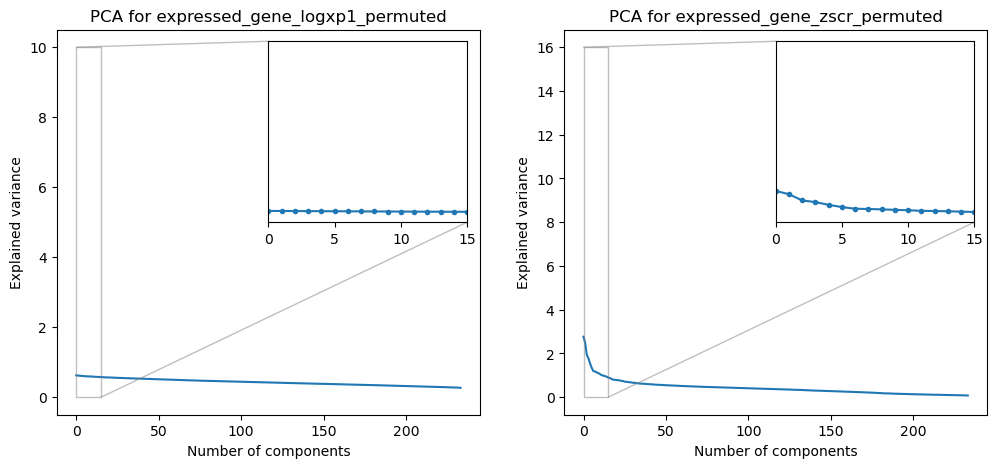

In [26]:
# repeat the analysis and plotting from the previous cell, but do that on a copy of the data where all columns have been permuted
# create a copy of the data with permuted columns
expressed_genes_zscore_permuted = np.array(expressed_genes_zscore).copy()
expressed_genes_logxp1_permuted = np.array(expressed_genes_logxp1).copy()
for i in range(expressed_genes_zscore_permuted.shape[1]):
    expressed_genes_zscore_permuted[:,i] = np.random.permutation(expressed_genes_zscore_permuted[:,i])
    expressed_genes_logxp1_permuted[:,i] = np.random.permutation(expressed_genes_logxp1_permuted[:,i])

# perform PCA analysis for expressed_gene_logxp1 and expressed_gene_zscr and plot the explained variance as function of PC for both (two panel, one figure) properly labeled
pca_logxp1_permuted = PCA().fit(expressed_genes_zscore_permuted)
pca_zscr_permuted = PCA().fit(expressed_genes_logxp1_permuted)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].plot(pca_logxp1_permuted.explained_variance_ratio_*100)
axs[0].set_xlabel('Number of components')
axs[0].set_ylabel('Explained variance')
axs[0].set_title('PCA for expressed_gene_logxp1_permuted')

axs[1].plot(pca_zscr_permuted.explained_variance_ratio_*100)
axs[1].set_xlabel('Number of components')
axs[1].set_ylabel('Explained variance')
axs[1].set_title('PCA for expressed_gene_zscr_permuted')

axins1 = axs[0].inset_axes([0.5, 0.5, 0.47, 0.47])
axins1.plot(pca_logxp1_permuted.explained_variance_ratio_*100,'.-')
axins1.set_xlim([0,15])
axins1.set_ylim([0, 10])
axins1.set_yticks([])
axs[0].indicate_inset_zoom(axins1)

axins2 = axs[1].inset_axes([0.5, 0.5, 0.47, 0.47])
axins2.plot(pca_zscr_permuted.explained_variance_ratio_*100,'.-')
axins2.set_xlim([0,15])
axins2.set_ylim([0, 16])
axins2.set_yticks([])
axs[1].indicate_inset_zoom(axins2)

plt.show()


/Users/rwollman/opt/miniconda3/envs/chem269/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


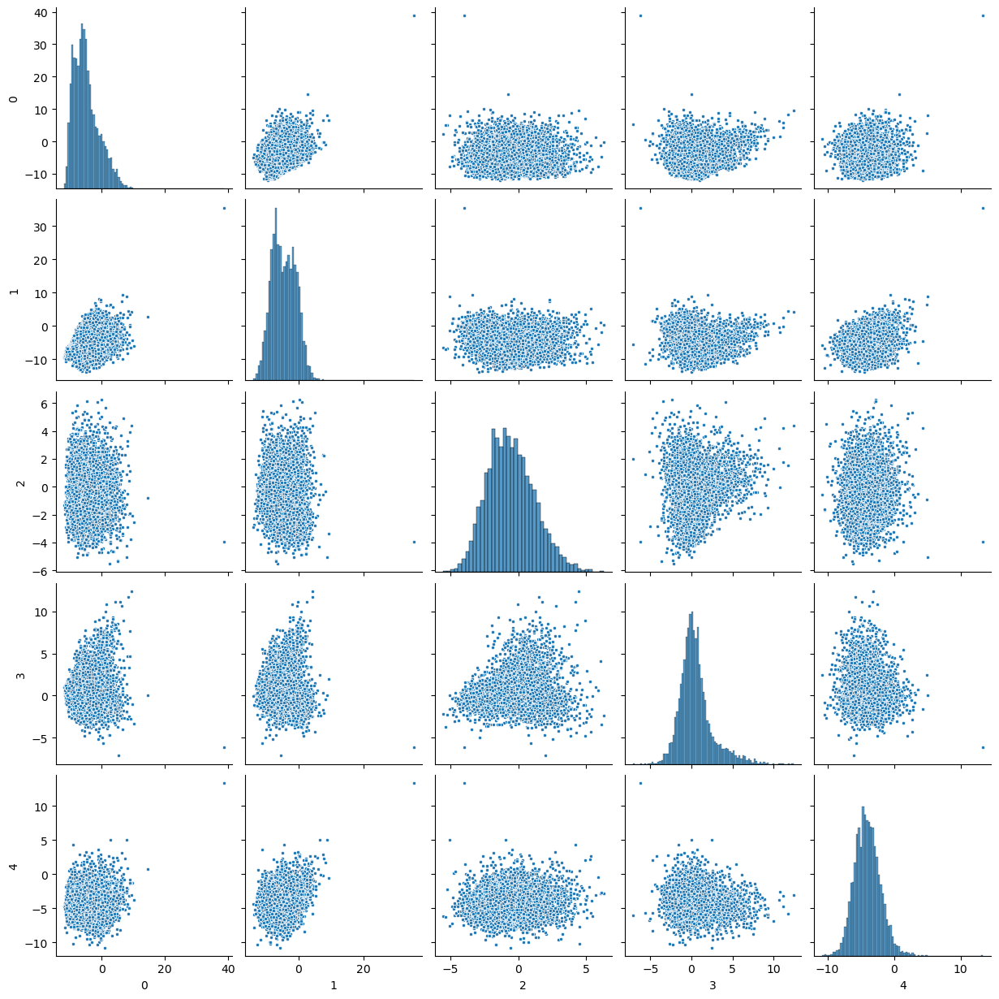

In [27]:

# chose the top 5 PCs from the zscore transformation
main_PCs_zscr = pca_zscr.transform(expressed_genes_zscore)[:,:5]

sns.pairplot(pd.DataFrame(main_PCs_zscr), markers='.')


As expected, very little correlation after PCA

<Axes: >

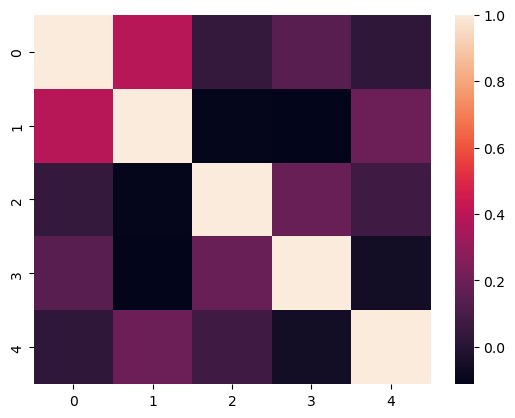

In [28]:
sns.heatmap(pd.DataFrame(main_PCs_zscr).corr())

### PCA summary
Principle Component Analysis is a way to find alternative representation of your data. 

There are math theorms that shows that this is the best you can do without distorting the data (i.e. linear change of coordinate system)

Why would that not be enough?

Let's look at an example

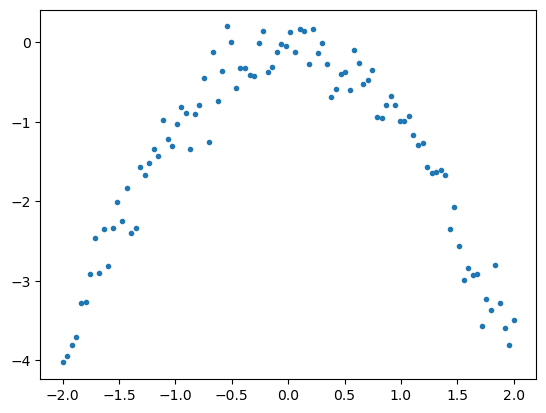

In [29]:
x = np.linspace(-2,2,100)
y = -x**2 + np.random.normal(0,0.25,size=len(x))

plt.plot(x,y,'.')

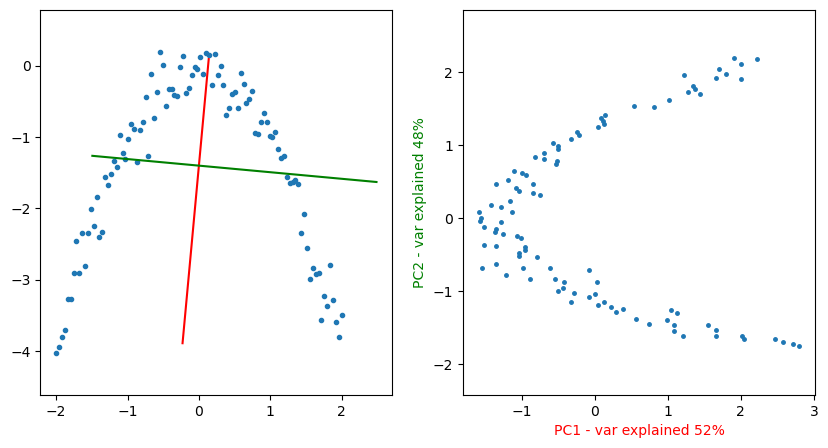

In [30]:

pca = PCA(n_components=2)
xy = np.hstack((x[:,np.newaxis],y[:,np.newaxis]))
pca.fit(xy)
pc1, pc2 = pca.components_
# center the red/green line around the center of x and y
x_center = np.mean(x)
y_center = np.mean(y)

# extend the red/green lines that represent the PCs 
ext_fctr = 1.5
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.plot(x,y,'.')
ax1.plot([x_center - ext_fctr*pc1[0], pc1[0]+x_center + ext_fctr*pc1[0]], [y_center - ext_fctr*pc1[1], pc1[1]+y_center + ext_fctr*pc1[1]], color='red')
ax1.plot([x_center - ext_fctr*pc2[0], pc2[0]+x_center + ext_fctr*pc2[0]], [y_center - ext_fctr*pc2[1], pc2[1]+y_center + ext_fctr*pc2[1]], color='green')
ax1.axis('equal');

ax2.plot(pca.transform(xy)[:,0], pca.transform(xy)[:,1], '.', markersize=5)
ax2.set_xlabel(f'PC1 - var explained {pca.explained_variance_ratio_[0]*100:.0f}%', color='red')
ax2.set_ylabel(f'PC2 - var explained {pca.explained_variance_ratio_[1]*100:.0f}%', color='green')
ax2.axis('equal');


Clearly there is a better representation of this data... linear transformation doesn't capture it well

Let's try a few non-linear dim reduction tools. 
The two most popular ones are tSNE and UMAP, but there are lots more!

Note that this "worked" in the sense that it placed the points on a line, but note how distorted they are along the line! 

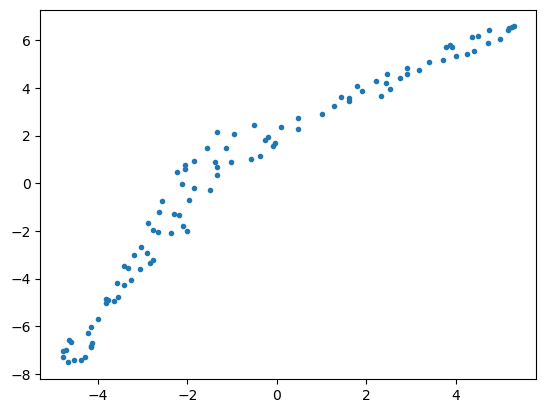

In [31]:


# Step 1: Import the necessary libraries

# Step 2: Create an instance of the TSNE class
tsne = TSNE(n_components=2)

# Step 3: Fit the t-SNE model to your data
xy_tsne = tsne.fit_transform(xy)

plt.plot(xy_tsne[:,0],xy_tsne[:,1],'.')

So this "kind" of worked? 

The problem is that tSNE is highly tunable. There are multiple parameters to tune, let's look at one of these called preplexity

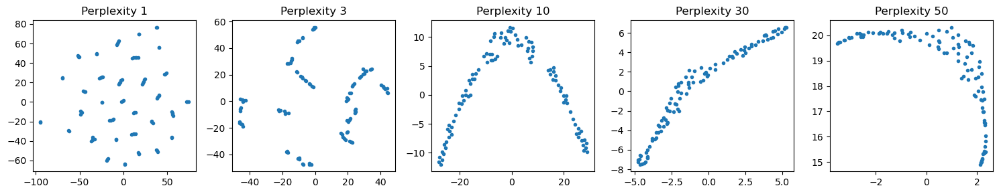

In [32]:
fig, axs = plt.subplots(1, 5, figsize=(15, 3))
perplexities = [1, 3, 10, 30, 50]
for i, perplexity in enumerate(perplexities):
    tsne = TSNE(n_components=2, perplexity=perplexity)
    xy_tsne = tsne.fit_transform(xy)
    axs[i].plot(xy_tsne[:,0],xy_tsne[:,1],'.')
    axs[i].set_title(f'Perplexity {perplexity}')
plt.tight_layout()



All of these are "correct"

In this case we like 30 as we KNOW that the data should follow a line, but in real cases, we don't know that! 

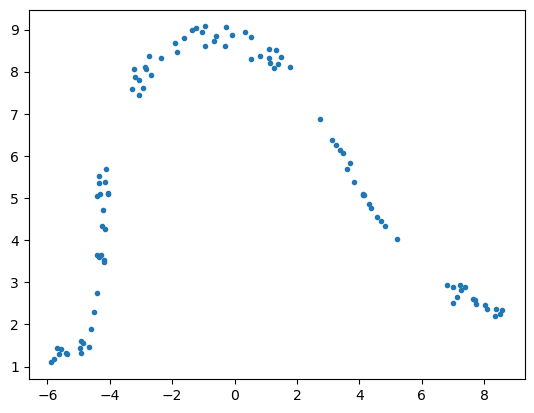

In [33]:
# Create an instance of the UMAP class
reducer = umap.UMAP(n_components=2)

# Fit the UMAP model to your data and transform the data
xy_umap = reducer.fit_transform(xy)

plt.plot(xy_umap[:,0],xy_umap[:,1],'.')

Now let's look at how these look for our gene data


In [34]:
gene_tsne = TSNE(n_components=2).fit_transform(expressed_genes_zscore_permuted)

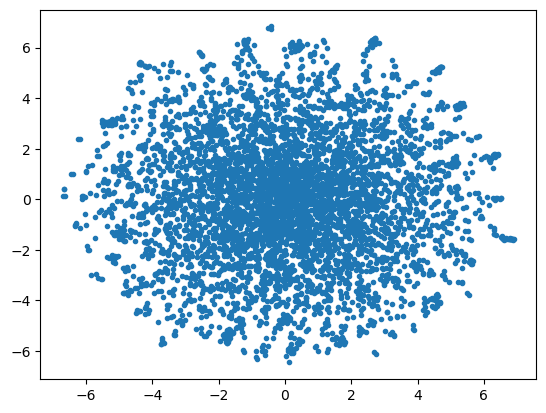

In [35]:
plt.plot(gene_tsne[:,0],gene_tsne[:,1],'.')

By defailt TSNE works on the first 50 PCs, we run it only our out top 5 to reduve things into 2d

In [36]:
gene_tsne_after_pca = TSNE(n_components=2).fit_transform(main_PCs_zscr)

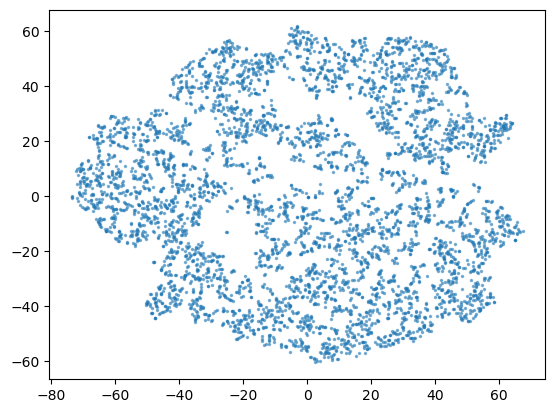

In [37]:
plt.plot(gene_tsne_after_pca[:,0],gene_tsne_after_pca[:,1],'.',markersize=3,alpha=0.5)

In [38]:
reducer = umap.UMAP(n_components=2)

# Fit the UMAP model to your data and transform the data
gene_umap = reducer.fit_transform(expressed_genes_zscore)

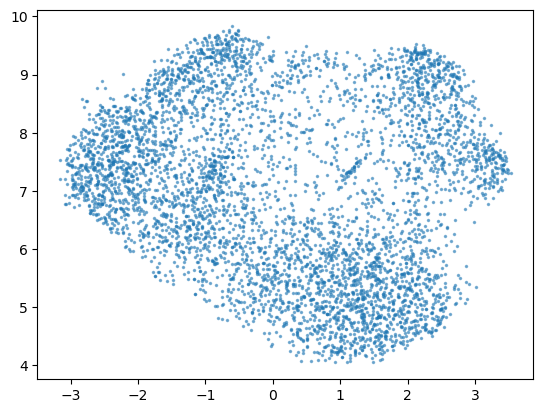

In [39]:
plt.plot(gene_umap[:,0],gene_umap[:,1],'.',markersize=3,alpha=0.5)

In [40]:
reducer = umap.UMAP(n_components=2)

# Fit the UMAP model to your data and transform the data
gene_umap_after_PCs = reducer.fit_transform(main_PCs_zscr)

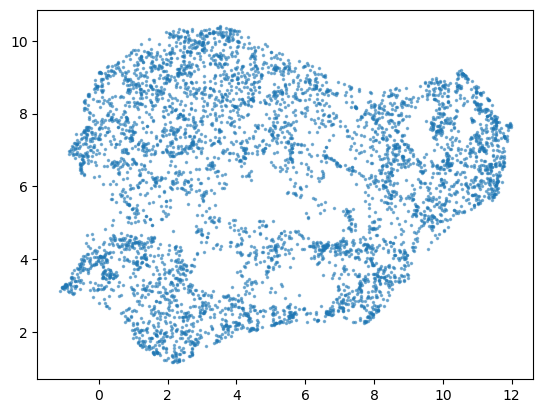

In [41]:
plt.plot(gene_umap_after_PCs[:,0],gene_umap_after_PCs[:,1],'.',markersize=3,alpha=0.5)

So what are all these UMAP/tSNE maps good for? 

Hard to say... 

Recently they came under a lot of scrutiny as they are "misused", i.e. authors interpret the position of points (which is somewhat arbitrary) as highly quantitative measurements. 

The best I can say is that they seem to be useful visualization tool when used as a "canvas" to plot other things on. 

Few examples: 

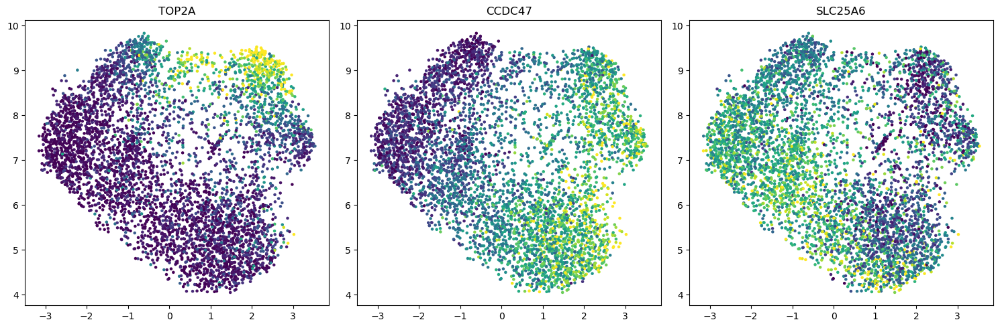

In [42]:
genes = ['TOP2A', 'CCDC47', 'SLC25A6']
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, gene in enumerate(genes):
    vmin, vmax = np.percentile(ca_genes[gene], [2.5, 97.5])
    axs[i].scatter(gene_umap[:,0], gene_umap[:,1], c=ca_genes[gene], s=5, vmin=vmin, vmax=vmax)
    axs[i].set_title(gene)

plt.tight_layout()



Note that if we did that with the tSNE representation that would have looked horribly:

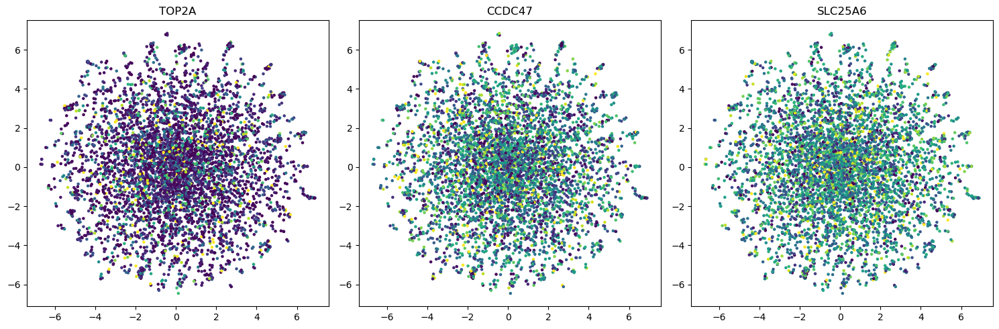

In [43]:
genes = ['TOP2A', 'CCDC47', 'SLC25A6']
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, gene in enumerate(genes):
    vmin, vmax = np.percentile(ca_genes[gene], [2.5, 97.5])
    axs[i].scatter(gene_tsne[:,0], gene_tsne[:,1], c=ca_genes[gene], s=5, vmin=vmin, vmax=vmax)
    axs[i].set_title(gene)

plt.tight_layout()

But it's reasonable with the tSNE done only on the top 5 PCs

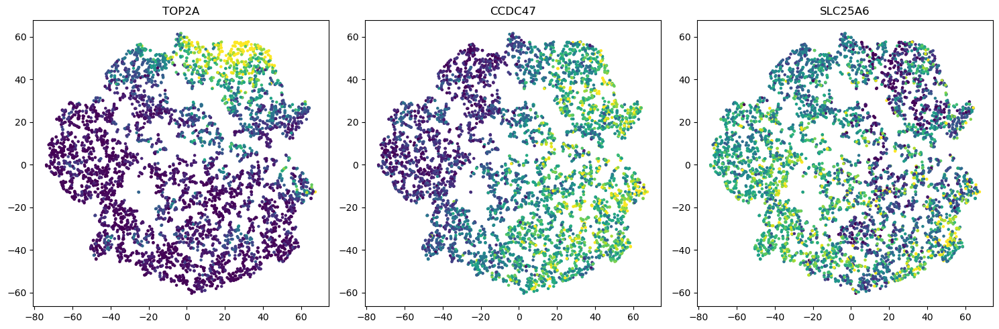

In [44]:
genes = ['TOP2A', 'CCDC47', 'SLC25A6']
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, gene in enumerate(genes):
    vmin, vmax = np.percentile(ca_genes[gene], [2.5, 97.5])
    axs[i].scatter(gene_tsne_after_pca[:,0], gene_tsne_after_pca[:,1], c=ca_genes[gene], s=5, vmin=vmin, vmax=vmax)
    axs[i].set_title(gene)

plt.tight_layout()

Of course we can also look at this on the top two PCs: 

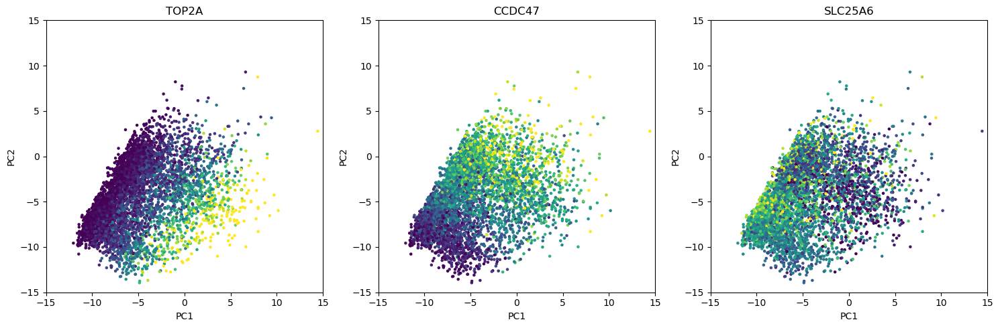

In [45]:
genes = ['TOP2A', 'CCDC47', 'SLC25A6']
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, gene in enumerate(genes):
    vmin, vmax = np.percentile(ca_genes[gene], [2.5, 97.5])
    axs[i].scatter(main_PCs_zscr[:,0], main_PCs_zscr[:,1], c=ca_genes[gene], s=5, vmin=vmin, vmax=vmax)
    axs[i].set_title(gene)
    axs[i].set_xlim([-15,15])
    axs[i].set_ylim([-15,15])
    axs[i].set_xlabel('PC1')
    axs[i].set_ylabel('PC2')
  

plt.tight_layout()

## Cluster analysis

Another popular way to try to find pattern in the data is to find (force) it into groups. 

To do that we need to define a few things: 

1. What does it mean for two sample to be "similar" to each other. 

2. What procedure (algorithm) do we want to use to bring similar things together

3. What "cutoffs" are we using to determine the actual groups. 

Let's go over these one by one

Text(0.5, 1.0, 'Top (100x100) section of distance matrix')

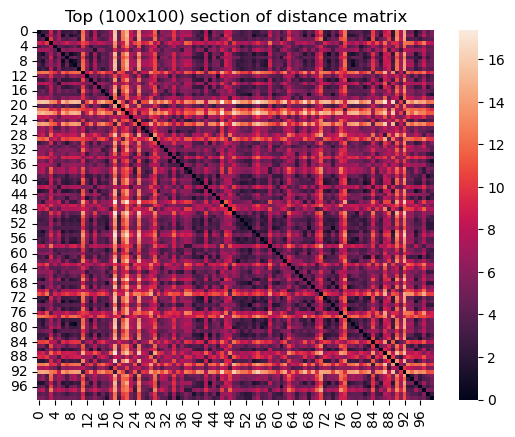

In [46]:
dist_matrix = distance.squareform(distance.pdist(main_PCs_zscr))

sns.heatmap(dist_matrix[:100,:100])
plt.title('Top (100x100) section of distance matrix')

By default this uses euclidean distance, but there are other options. Let's look at a simple example

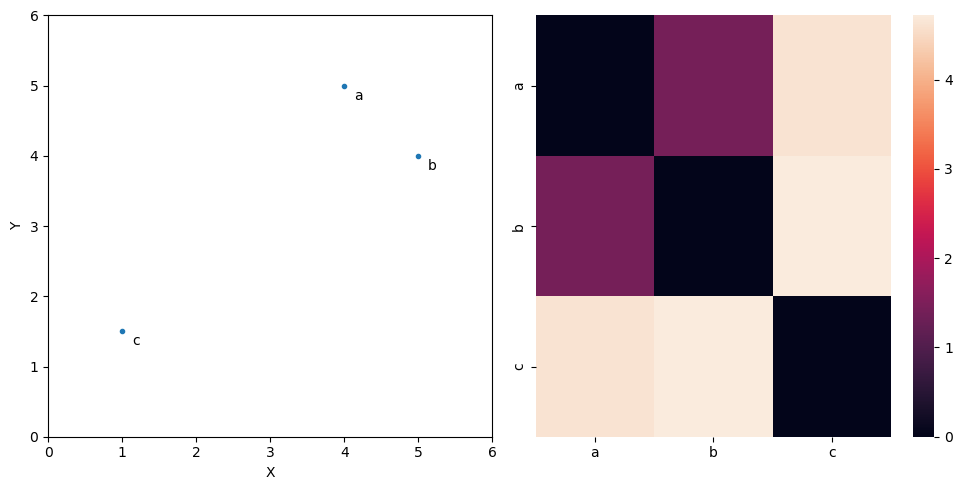

In [47]:
xy=np.array([[4,5,1],[5,4,1.5]]).T
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].plot(xy[:,0],xy[:,1],'.')
for i, txt in enumerate(['a', 'b', 'c']):
    axs[0].annotate(txt, (xy[i,0], xy[i,1]), textcoords="offset points", xytext=(10,-10), ha='center')
axs[0].set_xlim([0,6])
axs[0].set_ylim([0,6])
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

dst = distance.squareform(distance.pdist(xy))
sns.heatmap(dst, xticklabels=['a', 'b', 'c'], yticklabels=['a', 'b', 'c'], ax=axs[1])
plt.tight_layout()


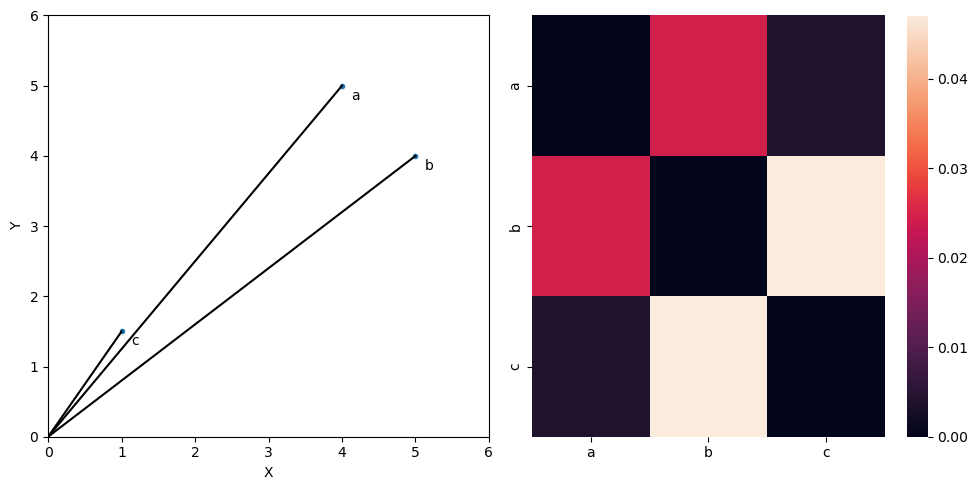

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].plot(xy[:,0],xy[:,1],'.')
for i, txt in enumerate(['a', 'b', 'c']):
    axs[0].annotate(txt, (xy[i,0], xy[i,1]), textcoords="offset points", xytext=(10,-10), ha='center')
    axs[0].plot([0, xy[i,0]], [0, xy[i,1]], 'k-') # added line to connect points to origin
axs[0].set_xlim([0,6])
axs[0].set_ylim([0,6])
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

dst = distance.squareform(distance.pdist(xy,  metric='cosine'))
sns.heatmap(dst, xticklabels=['a', 'b', 'c'], yticklabels=['a', 'b', 'c'], ax=axs[1])
plt.tight_layout()

Looking at the real data (first 100 cells):

Text(0.5, 1.0, 'Top (100x100) section of distance matrix')

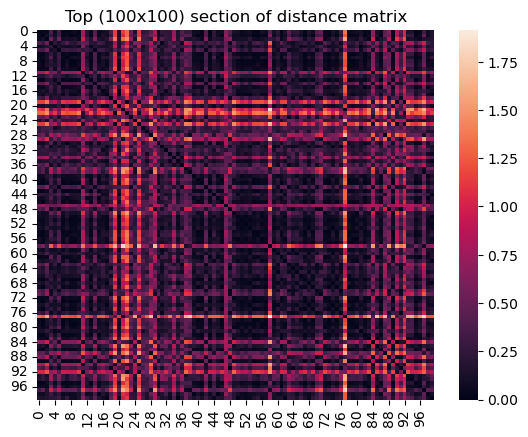

In [49]:
dist_matrix = distance.squareform(distance.pdist(main_PCs_zscr,metric='cosine'))

sns.heatmap(dist_matrix[:100,:100])
plt.title('Top (100x100) section of distance matrix')

Like a lot of things in EDA, which metric is the "right" one is hard to say. It depends on the data, your intuition, etc. 

First approximation, euclidean is not a bad default, but is subjective to scale. Cosine looks for relative patterns and not magnitudes. There are many other metrics. Ask your robot about it. 

## Procedure / Algorithm

The next animation illustrates how KMeans works. In short, this is an iterative algorithm that uses current label assignement (starts random) to find centers for each groups of points. In the next iterations, it assign each points to it's closest center, which then can be used to update the center position and so on. 

In [50]:
from sklearn.cluster import KMeans
from scipy.spatial import Voronoi, voronoi_plot_2d
from scipy.optimize import linear_sum_assignment
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Create a set of 20 points
np.random.seed(123)  # for reproducibility
n_pnts = 15
cntr1=1
cntr2=2
cntr3=3
sig=0.75
points = np.vstack((np.random.normal(cntr1, sig, (n_pnts, 2)), 
                    np.random.normal(cntr2, sig, (n_pnts, 2)),
                    np.random.normal(cntr3, sig, (n_pnts, 2))))

# Suppose `labels` is your initial label assignment
labels = np.random.randint(0, 3, len(points))  # replace with your actual labels

# Compute initial centroids based on your label assignment
initial_centroids = np.array([points[labels == i].mean(axis=0) for i in np.unique(labels)])
centroids = initial_centroids

kmeans = KMeans(n_clusters=3, init=initial_centroids, n_init=1, max_iter=1, algorithm='full')
kmeans.fit(points)

# Function to update the plot for each frame
def update(i):
    global kmeans
    global labels
    global centroids
    if i > 0:
        old_centroids = initial_centroids
        kmeans = KMeans(n_clusters=3, init=initial_centroids, n_init=1, max_iter=i, algorithm='full')
        kmeans.fit(points)

        # Sort the cluster centers and labels
        sorted_centroids_idx = np.argsort(kmeans.cluster_centers_[:, 0])
        sorted_centroids = kmeans.cluster_centers_[sorted_centroids_idx]
        sorted_labels = np.empty_like(kmeans.labels_)
        for old_label, new_label in enumerate(sorted_centroids_idx):
            sorted_labels[kmeans.labels_ == old_label] = new_label

        labels = sorted_labels
        centroids = sorted_centroids

    ax.clear()
    ax.scatter(points[:, 0], points[:, 1], c = labels)
    ax.scatter(centroids[:, 0], centroids[:, 1], s=300, c=(0,1,2),marker='x')  # plot the centroids

# Create the animation
fig, ax = plt.subplots()
anim = FuncAnimation(fig, update, frames=np.arange(0, 10), interval=200)
plt.close()

# Display the animation
HTML(anim.to_jshtml())

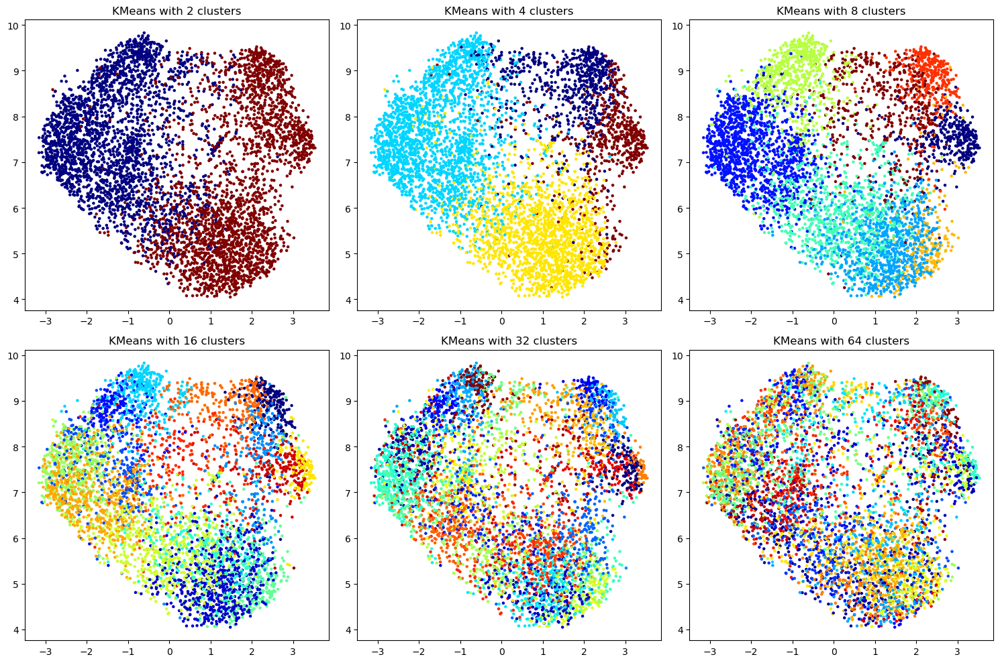

In [51]:
from sklearn.cluster import KMeans

# Run KMeans clustering on main_PCs_zscr using Euclidean metric and k=5
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
clusters = [2, 4, 8, 16, 32, 64]
for i, k in enumerate(clusters):
    cls_kmeans = KMeans(n_clusters=k, random_state=0).fit(main_PCs_zscr)
    ax = axs[i//3, i%3]
    ax.scatter(gene_umap[:,0], gene_umap[:,1], c=cls_kmeans.labels_, s=5, cmap='jet')
    ax.set_title(f'KMeans with {k} clusters')
plt.tight_layout()


Of course, no one tells you what K to choose... more on that later

### Heirarchial clustering

The core idea is that we "link" points/groups to each other to create groups. We repeat this "linking" until there is nothing to link. 

A nice feature of this is that this procedure creates a tree (dendrogram) that we can look at and interpret the clustering process. 

The downside is that it doesn't divide into groups, you still need to chose the "cutoff" to determine the groups. 

There are many variants. The core algorithm is always the same, but the definition of how we define distance once we collapsed points into groups. 

- Single: minimum of all distances
- Average: average of distances
- Ward: within-cluster variance

Each of these linkage methods create it's own tree. 

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Create a set of 20 points
np.random.seed(0)  # for reproducibility
cntrs = np.array(((0,0),(0,2),(2,0),(2,2)))
points = np.repeat(cntrs, 5, axis=0) + np.random.normal(0, 0.5, (20, 2))

# Perform hierarchical clustering
Z = linkage(points, method='single')  # replace 'single' with your preferred linkage method
poss_colors = plt.cm.tab10(np.arange(10))

# Function to update the plot for each frame
def update(i,Z,title):
    ax[0].clear()
    ax[1].clear()
    color_threshold = Z[i, 2] if i < points.shape[0]-1  else Z[:,2].max()+0.1
    color_threshold -= 0.00001
    dendrogram(Z, color_threshold=color_threshold, ax=ax[0])
    ax[0].set_title(title)
    labels = fcluster(Z, color_threshold, criterion='distance')
    unique, counts = np.unique(labels, return_counts=True)
    clr_labels = np.zeros_like(labels)
    group_num = 1
    for u, c in zip(unique, counts):
        if c > 1:
            clr_labels[labels == u] = group_num
            group_num += 1

    # Assign colors based on the order of merging
    colors = poss_colors[clr_labels]
    ax[1].scatter(points[:, 0], points[:, 1], c=colors)

# Create the animation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
anim = FuncAnimation(fig, lambda i: update(i, Z,'Single linkage'), frames=np.arange(0, len(points)), interval=200)
plt.close()

# Display the animation
HTML(anim.to_jshtml())

In [53]:
Z = linkage(points, method='average') 

# Create the animation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
anim = FuncAnimation(fig, lambda i: update(i, Z, 'Average linkage'), frames=np.arange(0, len(points)), interval=200)
plt.close()

# Display the animation
HTML(anim.to_jshtml())

In [41]:
Z = linkage(points, method='ward') 

# Create the animation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
anim = FuncAnimation(fig, lambda i: update(i, Z, 'Ward linkage'), frames=np.arange(0, len(points)), interval=200)
plt.close()

# Display the animation
HTML(anim.to_jshtml())


NameError: name 'linkage' is not defined

All the above where done with euclidean distance. We can use any distance metric we want, for example cosine

In [55]:
# Compute the linkage matrix using cosine distance
Z = linkage(points, method='average', metric='cosine')

# Create the animation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
anim = FuncAnimation(fig, lambda i: update(i, Z, 'Average linkage / cosine metric'), frames=np.arange(0, len(points)), interval=200)
plt.close()

# Display the animation
HTML(anim.to_jshtml())

### Graph based clustering

Another very popular approach for clustering is to convert the data into a graph and do computations on the graph. 

Graphs are just network where every datapoint becomes a node/vertex. Edges in these graph denote similarity. 

Edges could be weighted (include the similarity) or not. 

Often edges are added to the K nearest neighbors. This really helps computationally as instread of a everyone to everyone distance matrix that is N choose 2 (that could be really big if you have 1,000,000 datapoints) we only have to deal with k*N values. 

There are lots of algorithm to compute the kNN graph is fast (and sometime approximate) way. 

In general, converting data into graphs is a very useful computational approach. 

Once the data is in a graph format, there are many algorithms that find "communities" in the graph, i.e. partition the graph into subgraph based on some criteria. 

Here we'll show one such algorithm, Leiden and show how the resolution parameter changes the partition into clusters

In [56]:
import numpy as np
from sklearn.neighbors import kneighbors_graph
import igraph as ig
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import leidenalg
from IPython.display import HTML
import matplotlib.cm as cm

# Initialize points
cntrs = np.array(((0,0),(0,2),(2,0),(2,2)))
np.random.seed(0)  # for reproducibility
points = np.repeat(cntrs, 5, axis=0) + np.random.normal(0, 0.5, (20, 2))

# Create a k-NN graph
k = 4
A = kneighbors_graph(points, k, mode='distance', include_self=False)

# Convert the sparse matrix to a list of edges
edges = np.vstack(A.nonzero()).T.tolist()

# Create an igraph Graph from the edges
G = ig.Graph(edges=edges, directed=False)

# Compute the layout
layout = G.layout("kk")

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

resolutions = np.linspace(0,0.66,10)

# Function to draw the graph and the scatter plot
def draw(i):
    for ax in axs:
        ax.clear()
    # Apply the Louvain method
    partition = leidenalg.find_partition(G, leidenalg.RBConfigurationVertexPartition,resolution_parameter=resolutions[i])
    # Draw the graph with nodes colored based on their community
    colors = partition.membership
    cmap = cm.get_cmap('viridis', max(colors)+1)  # Get the colormap
    vertex_colors = [cmap(colors[i]) for i in range(len(colors))]  # Convert memberships to colors
    ig.plot(G, layout=layout, target=axs[0], vertex_color=vertex_colors, edge_color="gray")
    # Draw the scatter plot of the nodes
    axs[1].scatter(points[:, 0], points[:, 1], c=colors, cmap='viridis')

# Create the animation
ani = animation.FuncAnimation(fig, draw, frames=10, interval=200, repeat=True)
plt.close()

# Display the animation
HTML(ani.to_jshtml())

/var/folders/99/56hx10n97n33s3crjk9c0t600000gn/T/ipykernel_28865/2431161983.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(colors)+1)  # Get the colormap


### Evaluate clustering results

As you saw above, there are LOTS of ways to cluster data. How do you know which one is right? 

The sad answer is that you don't. Clustering is subjective interpretation and only if you can USE the clustering for something and get interesting results, you know that your interpretations is useful. 

Saying that, there are a lot of approaches that try to "score" goodness of clusters. They are often used to chose clustering parameters such as k in Kmeans, cutoff in heirarchail clustering and resolution in graph clustering

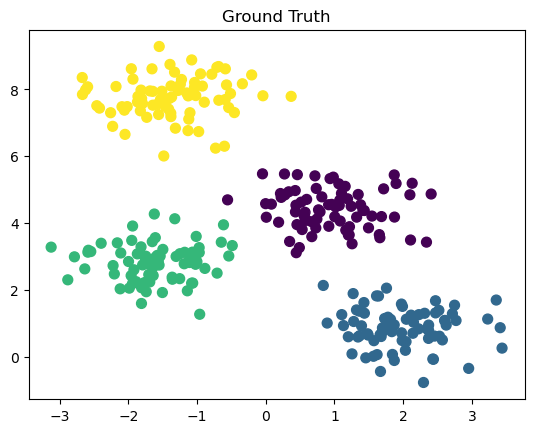

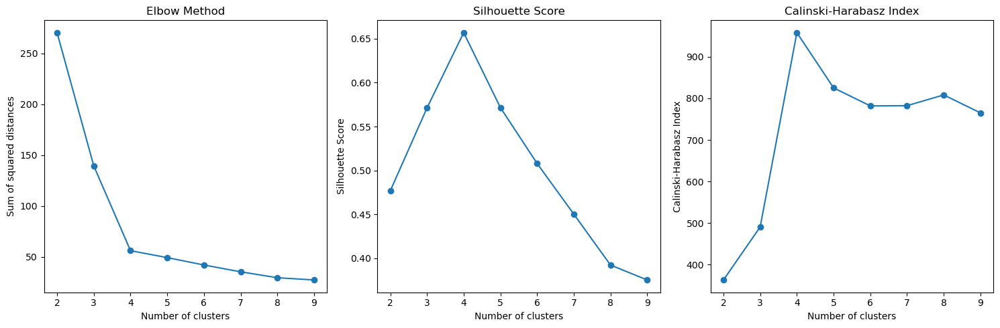

In [59]:
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Generate synthetic data
X, y_true = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

# Plot the data with the ground truth
plt.scatter(X[:, 0], X[:, 1], c=y_true, s=50, cmap='viridis')
plt.title('Ground Truth')
plt.show()

# Preprocess the data
X_scaled = StandardScaler().fit_transform(X)

# Variables to store results
elbow = []
silhouette = []
calinski_harabasz = []

# Range of k values to try
k_values = range(2, 10)

for k in k_values:
    # Run KMeans
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X_scaled)
    
    # Calculate sum of squared distances to closest centroid (for Elbow method)
    elbow.append(kmeans.inertia_)
    
    # Calculate Silhouette score
    silhouette.append(silhouette_score(X_scaled, kmeans.labels_))
    
    # Calculate Calinski-Harabasz index
    calinski_harabasz.append(calinski_harabasz_score(X_scaled, kmeans.labels_))

# Plot results
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.plot(k_values, elbow, 'o-')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')

plt.subplot(132)
plt.plot(k_values, silhouette, 'o-')
plt.title('Silhouette Score')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

plt.subplot(133)
plt.plot(k_values, calinski_harabasz, 'o-')
plt.title('Calinski-Harabasz Index')
plt.xlabel('Number of clusters')
plt.ylabel('Calinski-Harabasz Index')

plt.tight_layout()
plt.show()

Warning: these rarely work so well for real data... use biological judgment and proceed with cation

## Summary

Finding patterns in the data, i.e. exploratory data analysis is non trivial. 

It is a bit like starting a long hike in the mountain without a map/GPS etc. 

An experienced hiker can make educated guesses of where to go, but you can still meander for a long time. 

Decision made early one (data cleanup & filtering, transformation) will have a lot of impact on later steps. 

It is sometimes hard to know when you got somethere, keep the goal in mind

In [ ]:
cls_kmeans = KMeans(n_clusters=k, random_state=0).fit(main_PCs_zscr)

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Generate a linkage matrix
Z = linkage(main_PCs_zscr, 'ward')

# Cut the tree at a specified distance
max_d = 50
clusters = fcluster(Z, max_d, criterion='distance')